# Training Notebook

This notebook is part of LT5's submission as part of our Final Project. It includes the actual training run made in Google Colab. 

If the reader is interested in re-running the notebook, we recommend doing it in Google Colab (Pro) as the following cells were ran in that platform.

It is possible to run this notebook in Jojie, but it may run out of memory given the demanding requirements during model training.

We provide more details in the "Computational Requirements" section of the main notebook.

# Importation of Libraries

We need to mount Google Colab at the very start so we can smoothly run all cells from top to bottom without interruption. Doing it later may kill our notebook given the limited resources that Google Colab provides, especially to inactive notebooks.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


We clone the YOLOv5 repository into `/content` of our current Google Colab run.

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 11489, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 11489 (delta 23), reused 36 (delta 20), pack-reused 11449
Receiving objects: 100% (11489/11489), 11.33 MiB | 7.48 MiB/s, done.
Resolving deltas: 100% (7932/7932), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


We install the required dependencies. The latest run used Tesla P100 with 16GB.

In [ ]:
!pip install -qr requirements.txt
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 4.3 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


# Importation of Annotated and Augmented Data

As stated in our main notebook, we have used the Roboflow platform to annotated and augment the dataset. We simply import the `roboflow` library and use its API to conveniently download the dataset into our current run.

In [ ]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     |████████████████████████████████| 145 kB 5.6 MB/s 
     |████████████████████████████████| 138 kB 17.9 MB/s 
     |████████████████████████████████| 1.1 MB 23.6 MB/s 
     |████████████████████████████████| 67 kB 7.9 MB/s 
     |████████████████████████████████| 178 kB 71.0 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In Roboflow, we simply click "Export" and select "show download code" which provides the exact code with which to use in the cell below.

The API key is unique and should ideally not be shared outside trusted colleagues.

In [ ]:
%cd /content/yolov5
rf = Roboflow(api_key="3VdqjkWntpSGbpoM1y7a")
project = rf.workspace("manu-g").project("microplastics-2")
dataset = project.version(1).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to microplastics-2-1 in yolov5pytorch:: 100%|██████████| 2428/2428 [00:01<00:00, 1229.93it/s]


The loaded `data.yaml` file below provides more details on our imported dataset.

As you can see, Roboflow has already created `train` and `val` folders for us. 

Later, we will use the `test` folder to apply our best model.

In [ ]:
%cat {dataset.location}/data.yaml

names:
- dust
- plastic
nc: 2
train: microplastics-2-1/train/images
val: microplastics-2-1/valid/images


# YOLOv5 Model Training

We use the smallest version, YOLOv5s, for this run. We find this is the most appropriate model, given that we are seeking the least computationally expensive option in line with the problem statement (i.e., to rapidly detect microplastics in a low-cost manner, in line with the rationale of using holograms for detecting microplastics).

Most of the options are default; more details are provided in our main notebook, but saliently we used 500 epochs and 16 batches below. We save the weights in the `yolov5s_results` folder.

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 500 --data {dataset.location}/data.yaml --cfg ./models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 903 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='/content/yolov5/microplastics-2-1/data.yaml', device='', entity=None, epochs=500, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Star

# YOLOv5 Model Evaluation

We use Tensorboard and the traditional plots to evaluate the model.

Tensorboard is viewable through Google Colab, but will be unavailable to view in Jojie.

We provide the plots in matplotlib as an alternative to view the plots for evaluation. Full analysis are provided in our main notebook.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 829), started 0:01:47 ago. (Use '!kill 829' to kill it.)

<IPython.core.display.Javascript object>

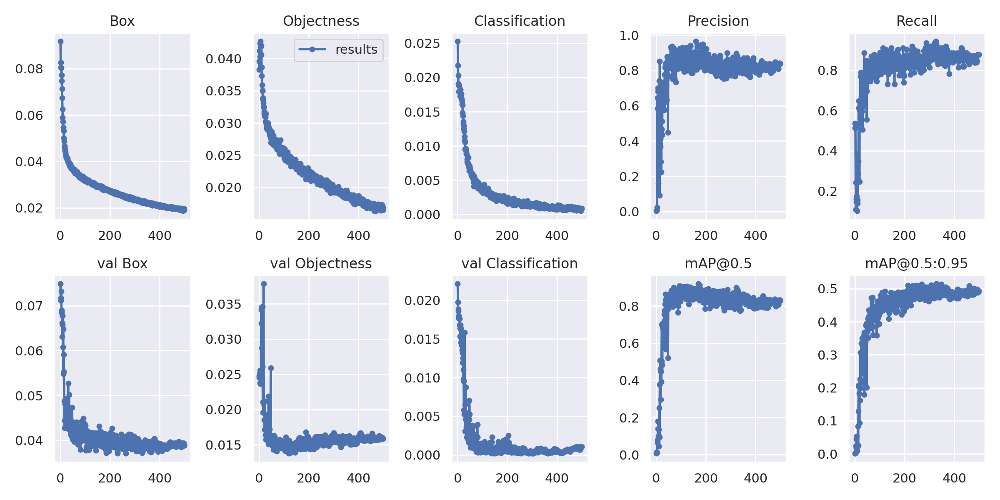

In [ ]:
from utils.plots import plot_results
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)

# Interlude: YOLOv5 Ground Truth Data

We share the ground truth annotated and augmented data, which uses a mosaic dataloader as first implemented in YOLOv4.

GROUND TRUTH TRAINING DATA:


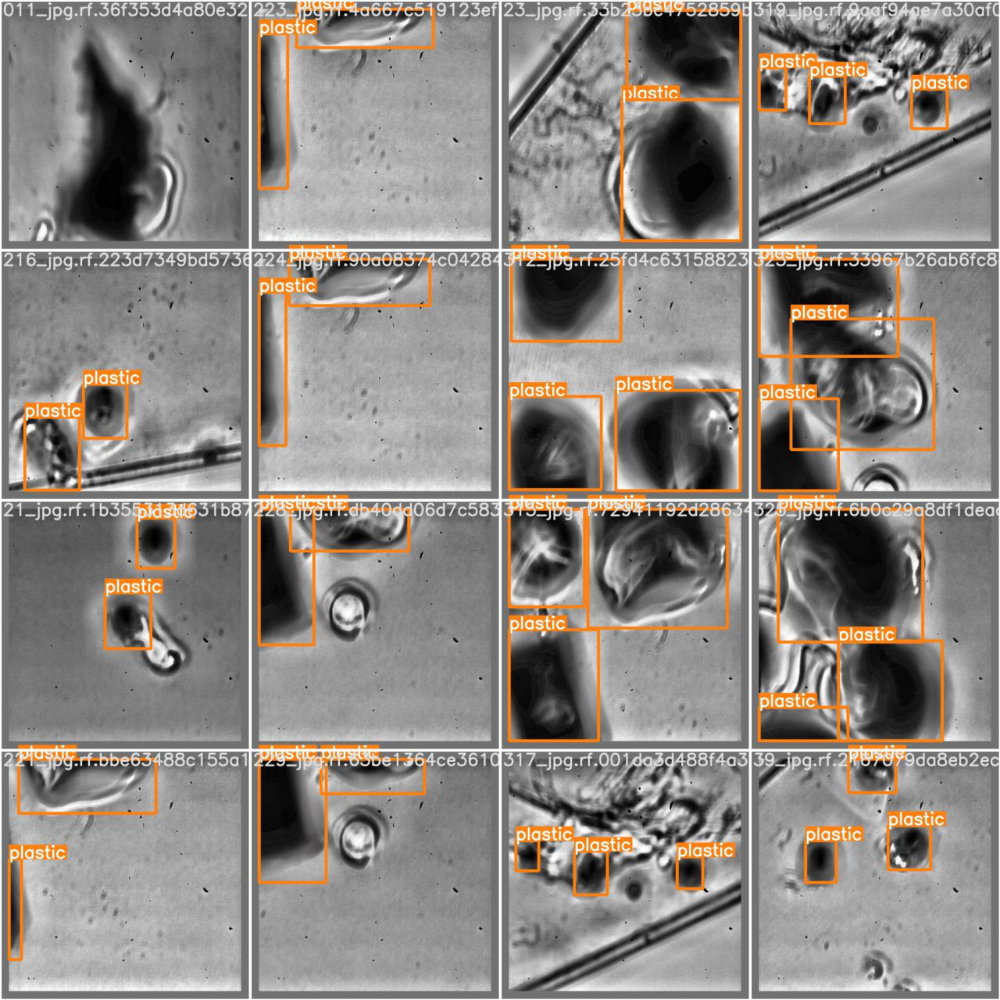

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


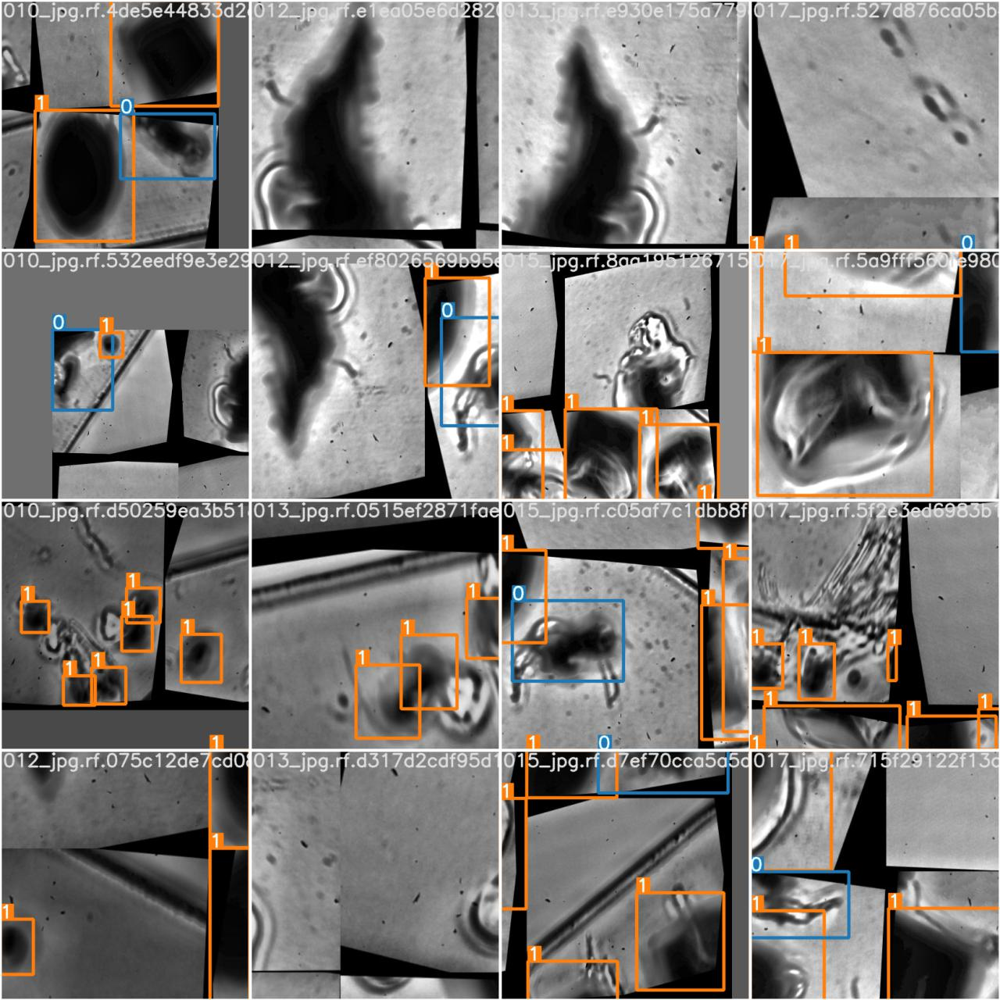

In [ ]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

# Inferences using the Best Weights

We save the best and latest weights under `runs/train/yolov5s_results/weights`.

In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


We use `best.pt` to run the inferences. As you can see, each line includes a count of plastics and dusts. It also include the inference time, of which all are made under a second.

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.3 --source /content/yolov5/microplastics-2-1/test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.3, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov5/microplastics-2-1/test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 224 layers, 7056607 parameters, 0 gradients, 16.3 GFLOPS
image 1/67 /content/yolov5/microplastics-2-1/test/images/014_jpg.rf.660e52a6215edf6003ee12825b455bf2.jpg: 416x416 Done. (0.007s)
image 2/67 /content/yol

We produce the images of the actual inferences made by the model. 

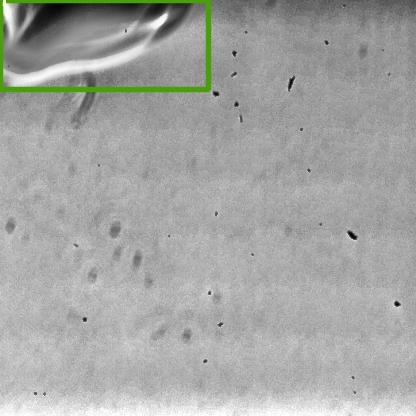

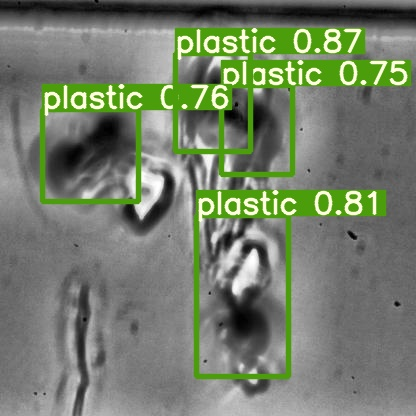

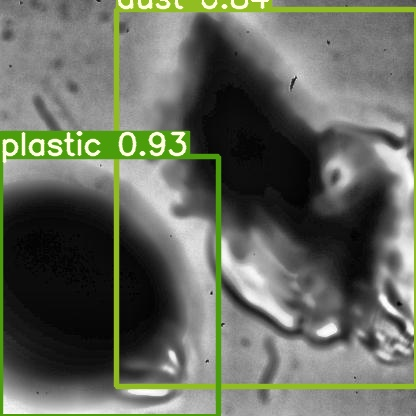

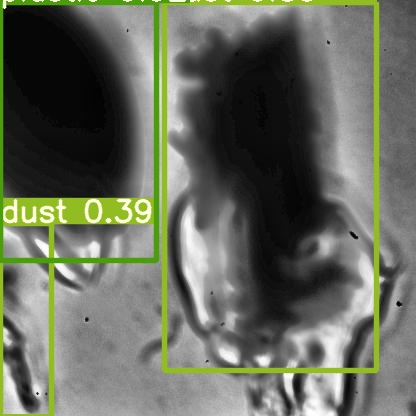

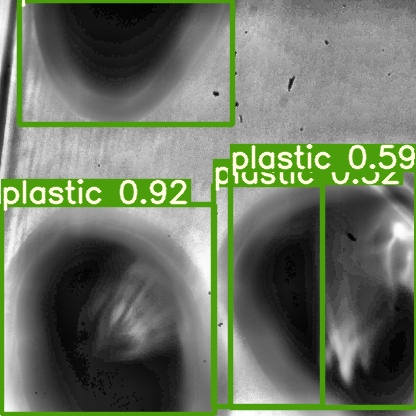

...

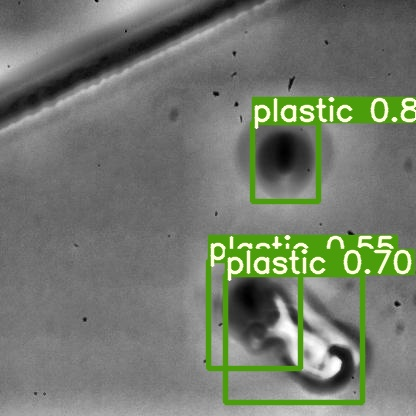

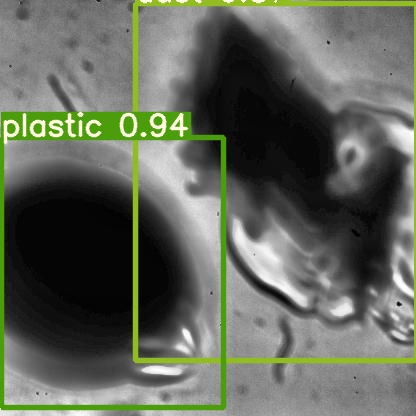

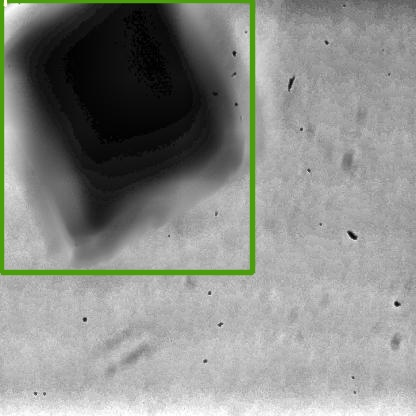

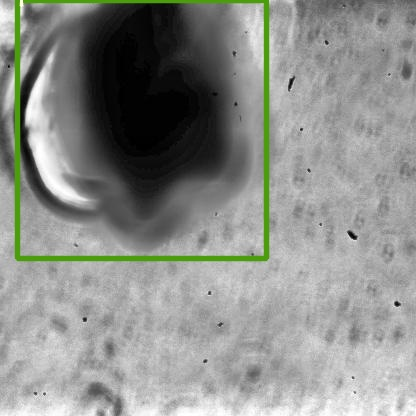

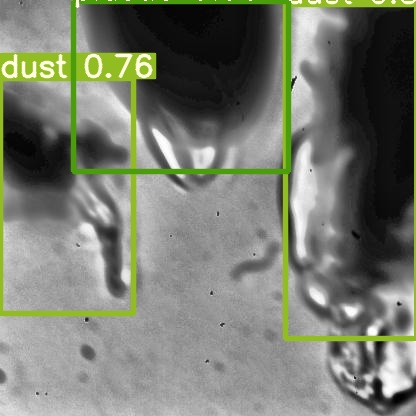

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

# Exportation of Best Weights 

We save our entire `yolov5` folder, which includes our best weights, in our Google Drive.

In [ ]:
%cp /content/yolov5/ /content/gdrive/My\ Drive/latest_yolov5 -r

# References

This notebook has used [Roboflow's blogpost](https://blog.roboflow.com/how-to-train-yolov5-on-a-custom-dataset/) as guide in using the microplastics datase for training.